### Distribución de Clusters DRV Churneados DiDi

- Reincio de variables

In [67]:
from IPython import get_ipython;   
get_ipython().magic('reset -sf')

C:\Users\User\AppData\Local\Temp\ipykernel_2644\1502431314.py:2: DeprecationWarning:

`magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).



#### K-means (K-medias)

- Importación de librerias algoritno K-Means

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import kaleido

- Lectura de datos

In [70]:
data = pd.read_excel('output.xlsx', sheet_name='Sheet1')

In [127]:
date = pd.read_excel('date_CB.xlsx')

- Previsualización de datos

In [72]:
data.head()

,driver_id,is_regular,driver_channel,driver_verify_status,driver_avg_star,calls,accepted_calls,trips,days_from_churn,Churned,first_trip,total_supply_hours,charging_time,BAQ,BGA,MED,product_id,trips_as_CB,Comeback
0,650910923736243,1,10,1,4.71,63,63,53,1100,1,20191101,17,11,1,0,0,41,11,1
1,650910923783944,1,10,1,5.00,5,5,3,1211,1,20191025,2,1,1,0,0,0,0,0
2,650910923885184,0,115,16,4.86,90,90,71,1065,1,20191226,100,16,1,0,0,0,0,0
3,650910924689134,1,10,1,4.92,1090,1090,821,420,1,20191022,547,179,1,0,0,41,225,1
4,650910925651499,1,115,1,0.00,2,2,1,550,1,20210816,1,0,1,0,0,0,0,0


- Previsualización de fechas de CB

In [73]:
date.head()

,driver_id,city_id,num,comeback_days,date_last_trip_date,comeback_date,week,Promo,Campaing_name,target
0,650911022276041,57010100,57010100,34,2023-04-14,2023-05-18,19,DxGy,BONO EXTRA de $125_000 al realizar 25 arrendam...,Comeback
1,650911022304207,57010100,57010100,96,2023-02-12,2023-05-19,19,DxGy,BONO EXTRA de $125_000 al realizar 25 arrendam...,Comeback
2,650911022334598,57010100,57010100,655,2021-07-29,2023-05-15,19,DxGy,BONO EXTRA de $125_000 al realizar 25 arrendam...,Comeback
3,650911022335904,57010100,57010100,79,2023-03-02,2023-05-20,19,DxGy,BONO EXTRA de $125_000 al realizar 25 arrendam...,Comeback
4,650911022364369,57010100,57010100,49,2023-03-28,2023-05-16,19,DxGy,BONO EXTRA de $125_000 al realizar 25 arrendam...,Comeback


- Obtención de valores pertenecientes a la clase DF correspondiente a los datos

In [74]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74441 entries, 0 to 74440
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   driver_id             74441 non-null  int64  
 1   is_regular            74441 non-null  int64  
 2   driver_channel        74441 non-null  int64  
 3   driver_verify_status  74441 non-null  int64  
 4   driver_avg_star       74441 non-null  float64
 5   calls                 74441 non-null  int64  
 6   accepted_calls        74441 non-null  int64  
 7   trips                 74441 non-null  int64  
 8   days_from_churn       74441 non-null  int64  
 9   Churned               74441 non-null  int64  
 10  first_trip            74441 non-null  int64  
 11  total_supply_hours    74441 non-null  int64  
 12  charging_time         74441 non-null  int64  
 13  BAQ                   74441 non-null  int64  
 14  BGA                   74441 non-null  int64  
 15  MED                

In [75]:
date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32806 entries, 0 to 32805
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   driver_id            32806 non-null  int64         
 1   city_id              32806 non-null  int64         
 2   num                  32806 non-null  int64         
 3   comeback_days        32806 non-null  int64         
 4   date_last_trip_date  32806 non-null  datetime64[ns]
 5   comeback_date        32806 non-null  datetime64[ns]
 6   week                 32806 non-null  int64         
 7   Promo                32806 non-null  object        
 8   Campaing_name        32806 non-null  object        
 9   target               32806 non-null  object        
dtypes: datetime64[ns](2), int64(5), object(3)
memory usage: 2.5+ MB


In [76]:
date['Promo'] = date['Promo'].astype(str)

In [77]:
min = data[["driver_avg_star", "calls","accepted_calls", "trips", "days_from_churn", "total_supply_hours", "charging_time"]].min()
max = data[["driver_avg_star", "calls","accepted_calls", "trips", "days_from_churn", "total_supply_hours", "charging_time"]].max()
factor = max-min

- Graficación de posible distribución para 4 variables de ingreso

In [84]:
fig1 = px.scatter(data, x="trips", y="total_supply_hours", color="accepted_calls",
                 size="days_from_churn",
                 width=700,
                 height=500)
fig1.update_layout(title="Total supply hours, trips, accepted calls, days from churn (size)")
fig1.show()
fig1.write_image('d.png')

ValueError: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido


In [103]:
'''fig2 = px.scatter_3d(data, x="trips", y="trips_as_CB", z="accepted_calls",
                     color="total_supply_hours",size="days_from_churn")
fig2.update_layout(title="5 Features Representation")
fig2.show()'''

'fig2 = px.scatter_3d(data, x="trips", y="trips_as_CB", z="accepted_calls",\n                     color="total_supply_hours",size="days_from_churn")\nfig2.update_layout(title="5 Features Representation")\nfig2.show()'

- Evaluación de la cantidad de clusters con el método del codo basado en la inercia, expresada como:
$$
\begin{equation}
\sum_{i=0}^{n}\min_{\mu_{j} \in C}(||x_{i}-\mu_{j}||^{2})
\end{equation}
$$
- Optmizando este valor por medio de la cantidad de grupos, sin embargo, sufre de distinta dimensionalidad para todas las variables logrando un valor no proporcional con cada una de estas

In [88]:
X = data.drop(["driver_id","BAQ","BGA","MED","is_regular", "driver_channel", "driver_verify_status","Churned", "first_trip", "Comeback", "product_id", "trips_as_CB"], axis=1)
scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)
inertia = []
for i in range(1,11):
    kmeans = KMeans(
        n_clusters=i, init="k-means++",
        n_init=10,
        tol=1e-04, random_state=42
    )
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)
fig = go.Figure(data=go.Scatter(x=np.arange(1,11),y=inertia))
fig.update_layout(title="Inertia vs Cluster Number", xaxis=dict(range=[0,11],title="Cluster Number"),
                  yaxis={'title':'Inertia'},
                 annotations=[
        dict(
            x=3,
            y=inertia[2],
            xref="x",
            yref="y",
            text="Elbow!",
            showarrow=True,
            arrowhead=7,
            ax=20,
            ay=-40
        )
    ])

In [89]:
partial = pd.DataFrame(X)
partial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74441 entries, 0 to 74440
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       74441 non-null  float64
 1   1       74441 non-null  float64
 2   2       74441 non-null  float64
 3   3       74441 non-null  float64
 4   4       74441 non-null  float64
 5   5       74441 non-null  float64
 6   6       74441 non-null  float64
dtypes: float64(7)
memory usage: 4.0 MB


In [90]:
kmeans = KMeans(
        n_clusters=5, init="k-means++",
        n_init=10,
        tol=1e-04, random_state=42
    )
kmeans.fit(X)
clusters = pd.DataFrame(X,columns = data.drop(["driver_id","BAQ","BGA","MED","is_regular", "driver_channel", "driver_verify_status","Churned", "first_trip", "Comeback", "product_id", "trips_as_CB"],axis=1).columns)
clusters['label']=kmeans.labels_
polar = clusters.groupby("label").mean().reset_index()
polar = pd.melt(polar,id_vars=["label"])
fig4 = px.line_polar(polar, r="value", theta="variable", color="label", line_close=True,height=800,width=1400)
fig4.show()

In [91]:
pie = clusters.groupby('label').size().reset_index()
pie.columns=['label','value']
px.pie(pie,values='value',names='label')

In [103]:
fig1 = px.scatter(clusters, x="trips", y="accepted_calls", color="label",
                 size="days_from_churn",
                 width=500,
                 height=500)
fig1.update_layout(title="4 Features Representation")
fig1.show()

In [104]:
clusters['comebacks'] = data.iloc[:,18]

In [105]:
clusters[['BAQ', 'BGA', 'MED']] = data.iloc[:, [13, 14, 15]]

In [106]:
clusters['driver_id'] = data.iloc[:,0]

In [107]:
g1 = clusters[clusters['label'] == 0]
g2 = clusters[clusters['label'] == 1]
g3 = clusters[clusters['label'] == 2]
g4 = clusters[clusters['label'] == 3]
g5 = clusters[clusters['label'] == 4]

In [108]:
proportion = g1['comebacks'].value_counts(normalize=True)
proportion2 = g2['comebacks'].value_counts(normalize=True)
proportion3 = g3['comebacks'].value_counts(normalize=True)
proportion4 = g4['comebacks'].value_counts(normalize=True)
proportion5 = g5['comebacks'].value_counts(normalize=True)

In [109]:
proportion5*100

0    93.56908
1     6.43092
Name: comebacks, dtype: float64

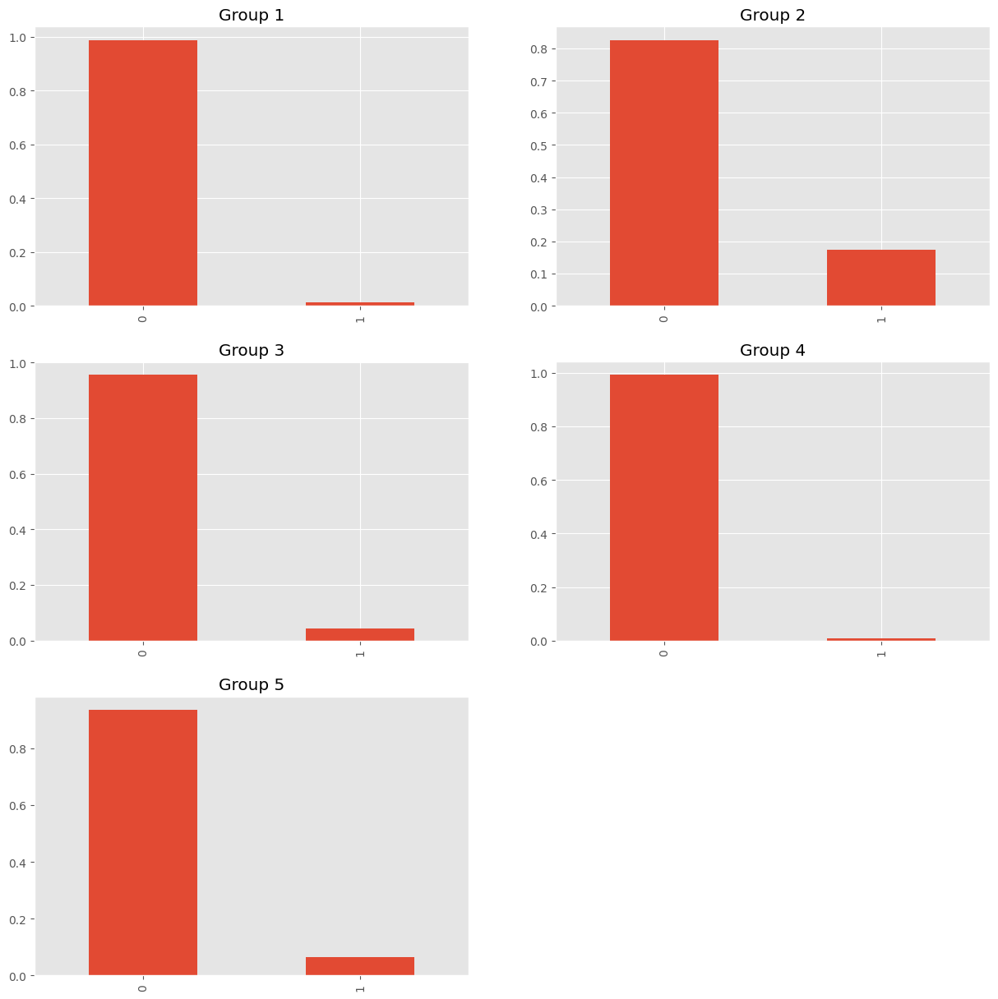

In [110]:
plt.style.use('ggplot')
fig, axs = plt.subplots(3,2)
fig.set_figheight(15)
fig.set_figwidth(15)
proportion.plot.bar(ax=axs[0,0])
axs[0,0].set_title("Group 1")
proportion2.plot.bar(ax=axs[0,1])
axs[0,1].set_title("Group 2")
proportion3.plot.bar(ax=axs[1,0])
axs[1,0].set_title("Group 3")
proportion4.plot.bar(ax=axs[1,1])
axs[1,1].set_title("Group 4")
proportion5.plot.bar(ax=axs[2,0])
axs[2,0].set_title("Group 5")
fig.delaxes(axs[2,1])
plt.grid()
plt.show()

In [111]:
# subdivisión de grupo 2 en ciudad

g2BAQ = g2[g2['BAQ'] == 1] 
g2BGA = g2[g2['BGA'] == 1] 
g2MED = g2[g2['MED'] == 1] 

# subdivisión de grupo 5 en ciudad

g5BAQ = g5[g5['BAQ'] == 1] 
g5BGA = g5[g5['BGA'] == 1] 
g5MED = g5[g5['MED'] == 1] 

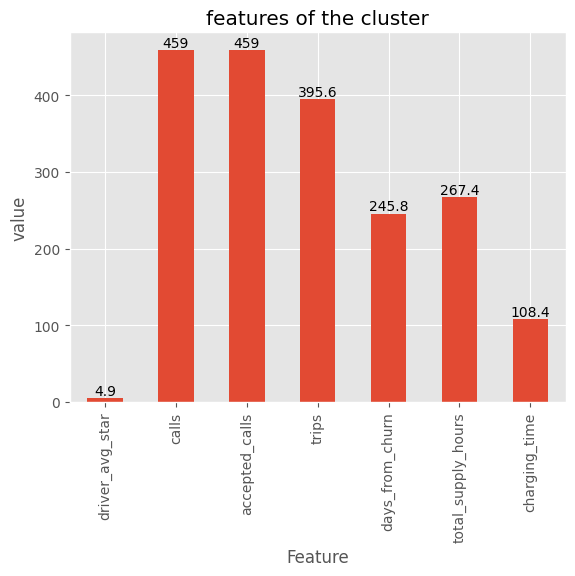

In [128]:
# 17.33% CB grupo 2 desempeño general
datag = g2.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datag = (datag.mean(axis=0))*(factor)
datag = datag + min
datag = round(datag,ndigits=1)
ax = datag.plot.bar()
ax.set_title("features of the cluster")
ax.set_xlabel("Feature")
ax.set_ylabel("value")
for container in ax.containers:
    ax.bar_label(container)

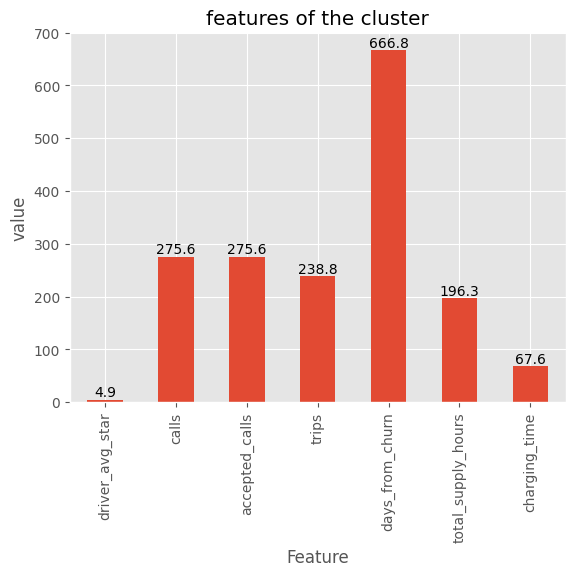

In [129]:
# 6.43% CB grupo 5

datag = g5.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datag = (datag.mean(axis=0))*(factor)
datag = datag + min
datag = round(datag,ndigits=1)
ax = datag.plot.bar()
ax.set_title("features of the cluster")
ax.set_xlabel("Feature")
ax.set_ylabel("value")
for container in ax.containers:
    ax.bar_label(container)

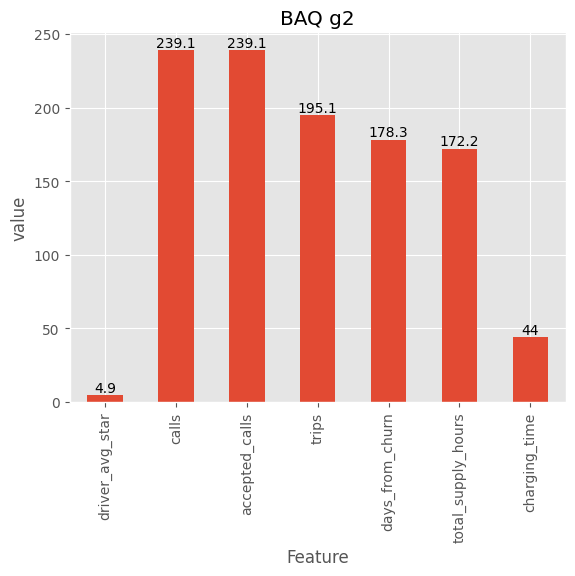

In [130]:
# BAQ g2

datagBAQ = g2BAQ.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datagBAQ = (datagBAQ.mean(axis=0))*(factor)
datagBAQ = datagBAQ + min
datagBAQ = round(datagBAQ,ndigits=1)
axs = datagBAQ.plot.bar()
axs.set_title("BAQ g2")
axs.set_xlabel("Feature")
axs.set_ylabel("value")
for container in axs.containers:
    axs.bar_label(container)

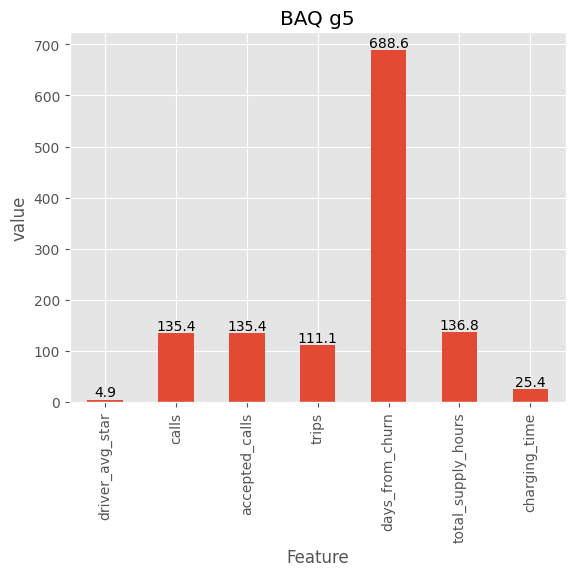

In [116]:
# BAQ g5

datagBAQ2 = g5BAQ.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datagBAQ2 = (datagBAQ2.mean(axis=0))*(factor)
datagBAQ2 = datagBAQ2 + min
datagBAQ2 = round(datagBAQ2,ndigits=1)
axs = datagBAQ2.plot.bar()
axs.set_title("BAQ g5")
axs.set_xlabel("Feature")
axs.set_ylabel("value")
for container in axs.containers:
    axs.bar_label(container)

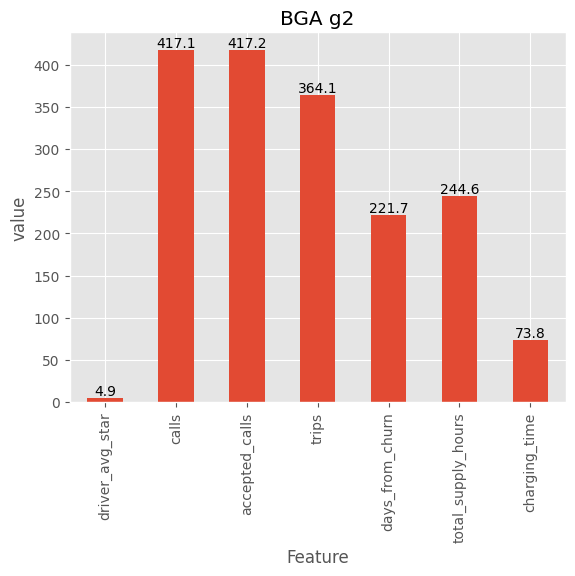

In [117]:
# BGA g2

datagBGA = g2BGA.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datagBGA = (datagBGA.mean(axis=0))*(factor)
datagBGA = datagBGA + min
datagBGA = round(datagBGA,ndigits=1)
axs = datagBGA.plot.bar()
axs.set_title("BGA g2")
axs.set_xlabel("Feature")
axs.set_ylabel("value")
for container in axs.containers:
    axs.bar_label(container)

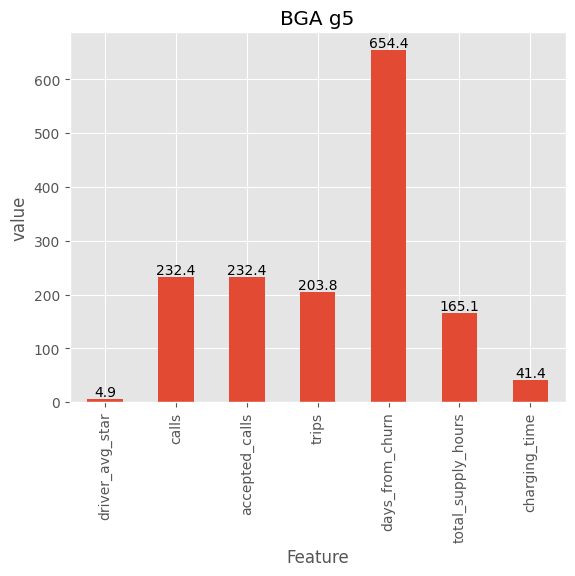

In [118]:
# BGA g5

datagBGA2 = g5BGA.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datagBGA2 = (datagBGA2.mean(axis=0))*(factor)
datagBGA2 = datagBGA2 + min
datagBGA2 = round(datagBGA2,ndigits=1)
axs = datagBGA2.plot.bar()
axs.set_title("BGA g5")
axs.set_xlabel("Feature")
axs.set_ylabel("value")
for container in axs.containers:
    axs.bar_label(container)

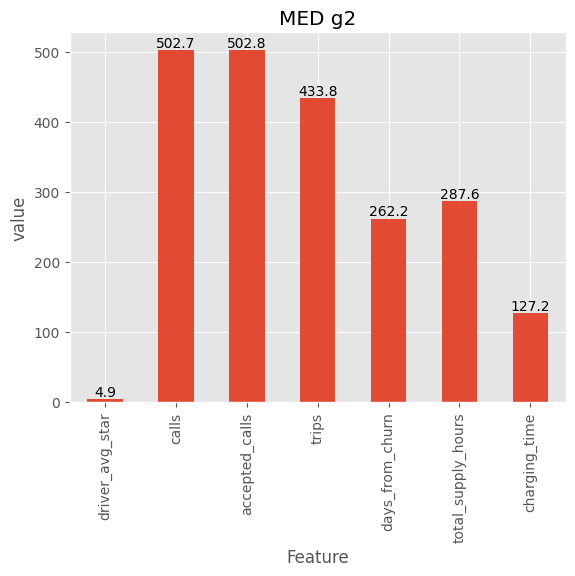

In [119]:
# MED g2

datagMED = g2MED.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datagMED = (datagMED.mean(axis=0))*(factor)
datagMED = datagMED + min
datagMED = round(datagMED,ndigits=1)
axs = datagMED.plot.bar()
axs.set_title("MED g2")
axs.set_xlabel("Feature")
axs.set_ylabel("value")
for container in axs.containers:
    axs.bar_label(container)

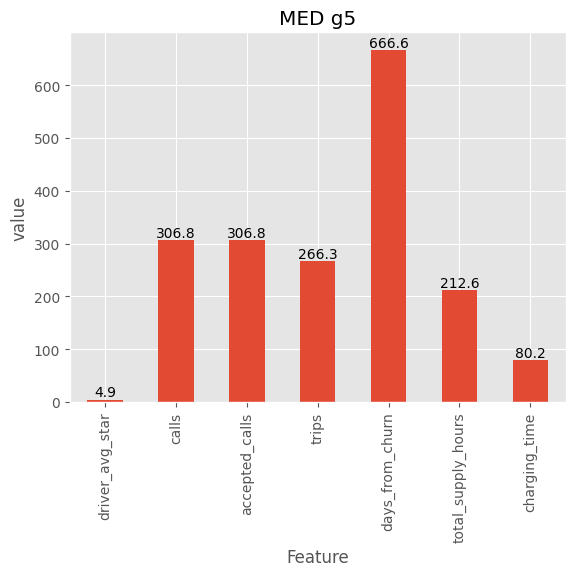

In [120]:
# MED g5

datagMED2 = g5MED.drop(['label','comebacks', 'driver_id','BAQ','BGA','MED'],axis=1)
datagMED2 = (datagMED2.mean(axis=0))*(factor)
datagMED2 = datagMED2 + min
datagMED2 = round(datagMED2,ndigits=1)
axs = datagMED2.plot.bar()
axs.set_title("MED g5")
axs.set_xlabel("Feature")
axs.set_ylabel("value")
for container in axs.containers:
    axs.bar_label(container)

In [121]:
date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32806 entries, 0 to 32805
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   driver_id            32806 non-null  int64         
 1   city_id              32806 non-null  int64         
 2   num                  32806 non-null  int64         
 3   comeback_days        32806 non-null  int64         
 4   date_last_trip_date  32806 non-null  datetime64[ns]
 5   comeback_date        32806 non-null  datetime64[ns]
 6   week                 32806 non-null  int64         
 7   Promo                32806 non-null  object        
 8   Campaing_name        32806 non-null  object        
 9   target               32806 non-null  object        
dtypes: datetime64[ns](2), int64(5), object(3)
memory usage: 2.5+ MB


In [131]:
date = date.drop(['target','city_id','date_last_trip_date'], axis = 1)

In [132]:
CB1_BAQ2 = pd.merge(g2BAQ, date, on = 'driver_id', how = 'inner')
CB2_BAQ5 = pd.merge(g5BAQ, date, on = 'driver_id', how = 'inner')

CB1_BGA2 = pd.merge(g2BGA, date, on = 'driver_id', how = 'inner')
CB2_BGA5 = pd.merge(g5BGA, date, on = 'driver_id', how = 'inner')

CB1_MED2 = pd.merge(g2MED, date, on = 'driver_id', how = 'inner')
CB2_MED5 = pd.merge(g5MED, date, on = 'driver_id', how = 'inner')

In [133]:
CB1_BAQ2.iloc[:,13].info()

<class 'pandas.core.series.Series'>
Int64Index: 2209 entries, 0 to 2208
Series name: num
Non-Null Count  Dtype
--------------  -----
2209 non-null   int64
dtypes: int64(1)
memory usage: 34.5 KB


In [154]:
pivot = pd.pivot_table(CB2_MED5, values='driver_id',
                            index='week',
                            columns='Promo',
                            aggfunc=np.count_nonzero)
pivot

Promo,DxGy,Guarantee,Multiplier
week,,,
18,NaN,115.0,6.0
19,172.0,NaN,NaN
20,97.0,NaN,NaN
21,127.0,NaN,NaN
22,123.0,NaN,NaN
23,65.0,NaN,NaN
24,70.0,NaN,NaN
25,87.0,NaN,NaN
26,83.0,NaN,NaN


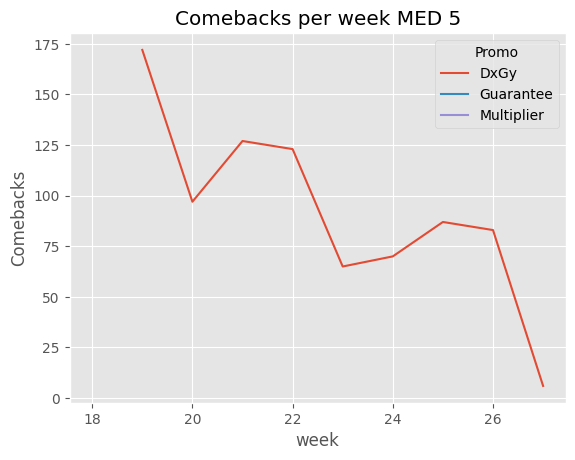

In [155]:
pivot.plot()
plt.title('Comebacks per week MED 5')
plt.xlabel('week')
plt.ylabel('Comebacks')
plt.show()

- BAQ

In [38]:
# BAQ
# tag 2

DXGY1 = CB1_BAQ2[CB1_BAQ2['Promo'] == "DxGy"].size
MUL1 = CB1_BAQ2[CB1_BAQ2['Promo'] == "Multiplier"].size
GUA1 = CB1_BAQ2[CB1_BAQ2['Promo'] == "Guarantee"].size

# tag 5

DXGY2 = CB2_BAQ5[CB2_BAQ5['Promo'] == "DxGy"].size
MUL2 = CB2_BAQ5[CB2_BAQ5['Promo'] == "Multiplier"].size
GUA2 = CB2_BAQ5[CB2_BAQ5['Promo'] == "Guarantee"].size

In [52]:
print('Grupo 2')
print((DXGY1*(11/13)/(DXGY1*(11/13)+MUL1*(2/13)+GUA1)))
print((MUL1*(2/13)/(DXGY1*(11/13)+MUL1*(2/13)+GUA1)))
print(GUA1/(DXGY1+MUL1+GUA1))

print('----')

print('Grupo 5')
print(DXGY2/(DXGY2+MUL2+GUA2))
print(MUL2/(DXGY2+MUL2+GUA2))
print(GUA2/(DXGY2+MUL2+GUA2))

print(np.abs(MUL2-MUL1)/MUL1)


Grupo 2
0.9517058263614047
0.04829417363859526
0.0
----
Grupo 5
0.7297668038408779
0.27023319615912206
0.0
0.5912863070539419


- BGA

In [40]:
# BGA
# tag 2

DXGY11 = CB1_BGA2[CB1_BGA2['Promo'] == "DxGy"].size
MUL11 = CB1_BGA2[CB1_BGA2['Promo'] == "Multiplier"].size
GUA11 = CB1_BGA2[CB1_BGA2['Promo'] == "Guarantee"].size

# tag 5

DXGY22 = CB2_BGA5[CB2_BGA5['Promo'] == "DxGy"].size
MUL22 = CB2_BGA5[CB2_BGA5['Promo'] == "Multiplier"].size
GUA22 = CB2_BGA5[CB2_BGA5['Promo'] == "Guarantee"].size

In [57]:
print('Grupo 2')
print(DXGY11/(DXGY11+MUL11+GUA11))
print(MUL11/(DXGY11+MUL11+GUA11))
print(GUA11/(DXGY11+MUL11+GUA11))

print('----')

print('Grupo 5')
print(DXGY22/(DXGY22+MUL22+GUA22))
print(MUL22/(DXGY22+MUL22+GUA22))
print(GUA22/(DXGY22+MUL22+GUA22))

print(np.abs(MUL22-MUL11)/MUL11)


Grupo 2
0.8674879807692307
0.13251201923076922
0.0
----
Grupo 5
0.919605077574048
0.08039492242595205
0.0
0.8707482993197279


revisar la frecuencia de todas las promos

- MED

In [42]:
# BGA
# tag 2

DXGY111 = CB1_MED2[CB1_MED2['Promo'] == "DxGy"].size
MUL111 = CB1_MED2[CB1_MED2['Promo'] == "Multiplier"].size
GUA111 = CB1_MED2[CB1_MED2['Promo'] == "Guarantee"].size

# tag 5

DXGY222 = CB2_MED5[CB2_MED5['Promo'] == "DxGy"].size
MUL222 = CB2_MED5[CB2_MED5['Promo'] == "Multiplier"].size
GUA222 = CB2_MED5[CB2_MED5['Promo'] == "Guarantee"].size

In [43]:
print('Grupo 2')
print(DXGY111/(DXGY111+MUL111+GUA111))
print(MUL111/(DXGY111+MUL111+GUA111))
print(GUA111/(DXGY111+MUL111+GUA111))

print('----')

print('Grupo 5')
print(DXGY222/(DXGY222+MUL222+GUA222))
print(MUL222/(DXGY222+MUL222+GUA222))
print(GUA222/(DXGY222+MUL222+GUA222))

print(np.abs(MUL22-MUL11)/MUL11)


Grupo 2
0.8236316246741964
0.0
0.17636837532580366
----
Grupo 5
0.8727655099894848
0.006309148264984227
0.12092534174553102
0.8707482993197279


#### K-neigbour closest (KNN)

- Importación de librerias

In [114]:
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier

In [115]:
comebacks = data[data["Comeback"]==1]
no_comebacks = data[data["Comeback"]==0]

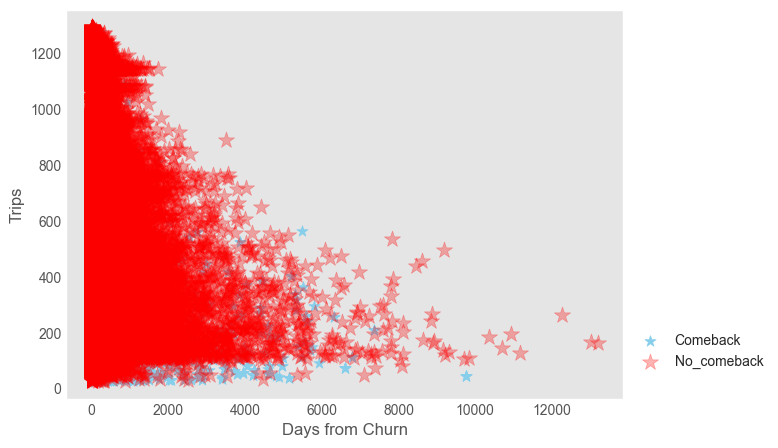

In [116]:
plt.scatter(comebacks["trips"], comebacks["days_from_churn"],
            marker = "*", s=70, color = "skyblue",
            label = "Comeback")
plt.scatter(no_comebacks["trips"], no_comebacks["days_from_churn"],
            marker = "*", s=150, color = "red",
            label = "No_comeback", alpha=0.3)
plt.xlabel("Days from Churn")
plt.ylabel("Trips")
plt.grid()
plt.legend(bbox_to_anchor=(1,0.2))
plt.show()